## Mount google drive

In [ ]:
# Use drive to manage datasets
from google.colab import drive

# Prompt for authorization
drive.mount("/content/drive/")

Mounted at /content/drive/


In [ ]:
project_path = "/content/drive/MyDrive/Projects/Omdena/Agro-Milan/tomato-disease/"

# Change the current working directory to your 'baba' folder.
%cd "{project_path}"

/content/drive/MyDrive/Projects/Omdena/Agro-Milan/tomato-disease


## EDA



- Clean file names
- Visual Inspection
- Pixel Distribution Analysis
- Image Quality Assessment
- Outlier Detection
- Class Imbalance Detection 



## Work

In [48]:
import os
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# import cv2
from skimage import color
from skimage.transform import rotate, rescale, resize
from skimage.filters import gaussian, try_all_threshold, threshold_otsu, threshold_local, threshold_li, threshold_yen, threshold_isodata, threshold_minimum
from skimage.restoration import denoise_bilateral, denoise_tv_chambolle, denoise_wavelet, denoise_nl_means
from skimage.exposure import equalize_adapthist, equalize_hist
# from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
# from skimage.metrics import  mean_squared_error as mse, normalized_root_mse as nrmse
from skimage.metrics import peak_signal_noise_ratio, structural_similarity, mean_squared_error, normalized_root_mse, normalized_mutual_information
from skimage.util import random_noise
from skimage.measure import blur_effect

import warnings
warnings.filterwarnings('ignore')

### Functions

###### Dataset Creation

In [36]:
def copy_rename_images(images, src_imgs_path, dest_imgs_path):
    if os.path.isdir(dest_imgs_path):
        shutil.rmtree(dest_imgs_path)

    os.makedirs(dest_imgs_path, exist_ok=True)
    
    for i, img in enumerate(images, start=1):
        image_ext = os.path.splitext(img)[1]
        # new_image_name = f"{disease_class}_{i:03d}{image_ext}"
        new_img_name = f"image_{i:03d}{image_ext}"

        img_src = os.path.join(src_imgs_path, img)
        img_dest = os.path.join(dest_imgs_path, new_img_name)
        
        shutil.copy(img_src, img_dest)

In [37]:
def create_ml_dataset(src_dir, dest_dir, train_split=None):
    """
    Copy and rename images per category(train, test) per class of the data 

    Parameters:
    src_dir (str): Source of dataset directory/folder containing data split(train, test, etc.).
    dest_dir (str): Destination of dataset directory/folder containing data split(train, test, etc.).
    train_split (float): Percentage of data to to set aside for training
    """

    # Clear the destination folder if it exists   
    if os.path.isdir(dest_dir):
        shutil.rmtree(dest_dir)


    # Get list of dataset categories/split
    splits = [split for split in os.listdir(src_dir)]

    # Create train, validation, and test sets for each fruit class
    for split in splits:
        src_path = os.path.join(src_dir, split)
        dest_path = os.path.join(dest_dir, split)
        
        disease_classes = os.listdir(src_path)

        # print(src_path)
        # print(disease_classes)

        for disease in disease_classes:
            src_imgs_path = os.path.join(src_path, disease)
            dest_imgs_path = os.path.join(dest_path, disease)

            images = os.listdir(src_imgs_path)
            random.shuffle(images)

            # print(images)
            
            is_train_split = (split == 'train') and train_split

            if is_train_split:
                train_disease_path = os.path.join(dest_dir, split, disease)
                val_disease_path = os.path.join(dest_dir, 'validation', disease) 

                limit = round(len(images) * train_split)
                val_images = images[limit : ]
                train_images = images[ : limit]

                copy_rename_images(val_images, src_imgs_path, val_disease_path)
                copy_rename_images(train_images, src_imgs_path, train_disease_path)
                # print('Yes')
                # print(len(val_images))
                # print(len(train_images))
            
            else:
                dest_disease_path = os.path.join(dest_dir, split, disease)
                # os.makedirs(dest_disease_path, exist_ok=True)
                
                copy_rename_images(images, src_imgs_path, dest_disease_path)
                # print('No')

###### Data Aquisition

In [38]:
def get_all_image_paths(data_dir, img_per_class=None):
    size = int(img_per_class) if img_per_class else None
    data = {}

    categories = os.listdir(data_dir)

    for category in categories:
        data[category] = {}
        cat_path = os.path.join(data_dir, category)

        classes = os.listdir(cat_path)

        # data[category] = { cls: list(os.listdir(os.path.join(cat_path, cls)))[ : size] for cls in classes }
        
        print(f'{category.capitalize()} Images:')

        for cls in classes:
            class_path = os.path.join(cat_path, cls)
            
            img_paths = [ os.path.join(class_path, img) for img in os.listdir(class_path) ]

            data[category].update({ cls : img_paths[ : size] })
            print('\t', f'{len(img_paths)} {cls}')

    return data

###### Pixel Distribution Analysis

In [39]:
# Plot histogram/distribution of pixels

def plot_dist(pixels, ax, color='gray', title=None, label=None, image=False, cmap='gray'):
    if image:
        ax.imshow(pixels, cmap=cmap)
        # ax.axis('off')
        # ax.set_frame_on(False)
        ax.spines[['right', 'top', 'left']].set_visible(False) # Hide the left, right and top spines
        ax.get_yaxis().set_visible(False)
        ax.set_title('Original', fontsize='small') 
        ax.set_title(title, fontsize='small', fontweight='medium')
    
    else:
        # plt.hist(pixels.ravel(), bins=256, color=color, alpha=0.7, label=label)
        
        # plt.xlabel('Pixel Intensity')
        # plt.ylabel('Frequency')    
        # plt.tick_params('y', labelleft=False)
        
        # Add a title
        # plt.title(title)
    
        ax.hist(pixels.ravel(), bins=256, color=color, label=label)
        ax.spines[['right', 'top', 'left']].set_visible(False) # Hide the left, right and top spines
        ax.get_yaxis().set_visible(False)
        # ax.set_title(title, fontsize='small')
        ax.set_title(title, fontsize='small', fontweight='medium')


In [40]:
def analyze_pixel_dist(img, img_class=None):
    """
    Analyzes the pixel distribution of an image by plotting histograms for each color channel.

    Args:
        img (numpy.ndarray): The image data as a NumPy array.
        img_class (str): The image class
    """

    # Check if grayscale image
    not_multichannel = len(img.shape) == 2
    
    # Create the figure
    fig = plt.figure(figsize=(10, 5))
    

    if not_multichannel:
        # Display original image
        ax1 = fig.add_subplot(1, 2, 1)
        ax2 = fig.add_subplot(1, 2, 2)

        plot_dist(img, ax1, image=True, cmap='gray') 
        plot_dist(img, ax2) 

    else:
        # Add channel subplots
        for i in range(img.shape[2]):
            colors = ['Red', 'Green', 'Blue']

            channel = img[:, :, i]
            color = colors[i].lower()
            title = f'{colors[i]} Channel'
            color_map = f'{colors[i]}s'
                
            # Display original image
            ax1 = fig.add_subplot(2, 3, i+1)
            ax2 = fig.add_subplot(2, 3, i+4)

            plot_dist(img, ax1, image=True, cmap=color_map) 
            plot_dist(channel, ax2, color, title)


    fig.suptitle(f'Pixel Distribution Analysis ({img_class})', fontsize=14)
    # Show the plot
    plt.tight_layout()
    plt.show()



###### Image Quality Assessment

In [53]:
# Compute Median Absolute Deviation (MAD)
def calculate_mad(image):
    if len(image.shape) == 3:
        # Convert to grayscale if the image is colored
        image = color.rgb2gray(image)
    
    # Compute the median of the image
    median = np.median(image)
    
    # Compute the absolute deviations from the median
    abs_deviation = np.abs(image - median)
    
    # Compute the median of the absolute deviations
    mad = np.median(abs_deviation)
    
    return mad

In [60]:
def show_quality (ref_img, test_img, ax, cmap='gray', title=None, c_axis=None):
    
    # Compute quality metrics
    psnr = peak_signal_noise_ratio(ref_img, test_img)
    mse = mean_squared_error(ref_img, test_img)
    ssim = structural_similarity(ref_img, test_img, data_range = ref_img.max() - ref_img.min(), channel_axis=c_axis)
    nmi = normalized_mutual_information(ref_img, test_img)
    blur = blur_effect(test_img, channel_axis=c_axis)
    mad = calculate_mad(test_img)

    # ax.imshow(test_img, cmap, vmin=0, vmax=1)
    ax.imshow(test_img, cmap)
    if c_axis:
        ax.set_xlabel(f'Blur: {blur:.2f}, MSE: {mse:.2f}, NMI: {nmi:.2f}, PSNR: {psnr:.2f}, MAD: {mad:.2f}', fontsize='xx-small')
    else:
        ax.set_xlabel(f'Blur: {blur:.2f}, MSE: {mse:.2f}, SSIM: {ssim:.2f}, PSNR: {psnr:.2f}, MAD: {mad:.2f}', fontsize='xx-small')

    # ax.spines[['right', 'top', 'left']].set_visible(False)
    # ax.get_yaxis().set_visible(False)
    ax.set_title(title, fontsize='small', fontweight='medium')

In [58]:
def assess_image_quality(img, img_class=None):
    """
    Assesses the quality of an image for image classification by plotting corresponding quality metrics.

    Args:
        img (numpy.ndarray): The image data as a NumPy array.
        img_class (str): The image class
    """
  
    # c_axis = None if len(ref_img.shape) == 2 else 2
    c_axis = (2, None)[len(img.shape) == 2]
    img_type = ('RGB', 'Grayscale')[len(img.shape) == 2]

    augmentations = [('Original', img)]

    # Apply filters (gaussian)
    augmentations.append(('Gaussian smoothing', gaussian(img, channel_axis=c_axis)))
    
    # Image is 2D
    if not c_axis:
        # Grayscale filters: Find and apply optimal threshold with different methods
        augmentations.append(("Thresholding: Yen's method", img > threshold_yen(img)))
        augmentations.append(("Thresholding: Otsu's method", img > threshold_otsu(img)))
        augmentations.append(("Thresholding: Li's method", img > threshold_li(img)))
        augmentations.append(("Thresholding: ISODATA method", img > threshold_isodata(img)))

    
    # Apply restoration (total variation filter denoising, bilateral filter denoising, non-local means denoising, wavelet denoising )
    augmentations.append(('Total variation(TV) filter denoising', denoise_tv_chambolle(img, channel_axis=c_axis)))
    augmentations.append(('Bilateral filter denoising', denoise_bilateral(img, channel_axis=c_axis)))
    augmentations.append(('Non-local means denoising', denoise_nl_means(img, channel_axis=c_axis)))
    augmentations.append(('Wavelet denoising', denoise_wavelet(img, channel_axis=c_axis)))

    # Image contrast correction/improvement (Histogram equalization, adaptive histogram equalization)
    augmentations.append(('Histogram equalization', equalize_hist(img)))
    augmentations.append(('Adaptive histogram equalization(CLAHE)', equalize_adapthist(img, clip_limit=0.01)))

    # Add noise
    augmentations.append(('Noisy image', random_noise(img)))
    
    # Rotate, flip vertically and horizontally
    # augmentations.append(('Rotate 90 deg', rotate(img, 90) ))
    augmentations.append(('Vertically flipped', np.flipud(img)))
    augmentations.append(('Horizontally flipped', np.fliplr(img)))


    # Desired columns in plot
    cols = 3

    if len(augmentations) % cols:
        rows = len(augmentations) // cols + 1
    else:
        rows = len(augmentations) // cols
    
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(3.5*cols, 3*rows), sharex=True, sharey=True)
    ax = axes.ravel()

    for idx, item in enumerate(augmentations):
        show_quality(img, test_img=item[1], ax=ax[idx], title=item[0], c_axis=c_axis)
    
    fig.suptitle(f'{img_type} Image Quality Assessment ({img_class})', fontsize=14)
    plt.tight_layout()
    plt.show()

###### Combined Analysis

In [62]:
def run_analysis(data_paths, img_classes, data_set='train'):
    for img_class in img_classes:
        img_paths = data_paths[data_set][img_class]
        img_shapes = [plt.imread(img_path).shape for img_path in img_paths]

        print('\n')
        print('----' * 30)
        print(f'IMAGE ANALYSIS FOR {img_class.upper()} in {data_set.upper()} SET')
        print('----' * 30, '\n')

        print(f'Unique image sizes (width, height, channels): {set(img_shapes)}', '\n')

        # Get first image from train set
        img_path = img_paths[0]

        image = plt.imread(img_path)
        img_gray = color.rgb2gray(image)

        # Pixel Distribution
        analyze_pixel_dist(image, img_class)

        # Image quality
        assess_image_quality(image, img_class)
        assess_image_quality(img_gray, img_class)

### Create datasets

In [ ]:
# Define paths
dataset_dir = 'dataset'
processed_dir = 'processed'


# Define training size
train_split = 0.8

# Split and move images to respective folders
create_ml_dataset(dataset_dir, processed_dir, train_split)

### Image Analysis


###### Get images

In [43]:

# Import datasets
# data_dir = 'processed'
data_dir = 'cleaned'

# Import datasets
#data_paths = get_all_image_paths(data_dir, 5)
data_paths = get_all_image_paths(data_dir)

Test Images:
	 100 Bacterial_spot_bacteria
	 100 Tomato_healthy
	 100 Two-spotted_spider_mite_pest
	 100 Yellow_Leaf_Curl_Virus
Train Images:
	 800 Bacterial_spot_bacteria
	 800 Tomato_healthy
	 800 Two-spotted_spider_mite_pest
	 800 Yellow_Leaf_Curl_Virus
Validation Images:
	 200 Bacterial_spot_bacteria
	 200 Tomato_healthy
	 200 Two-spotted_spider_mite_pest
	 200 Yellow_Leaf_Curl_Virus


###### Display/Conduct Analysis



------------------------------------------------------------------------------------------------------------------------
IMAGE ANALYSIS FOR TOMATO_HEALTHY in TRAIN SET
------------------------------------------------------------------------------------------------------------------------ 

Unique image sizes (width, height, channels): {(256, 256, 3)} 



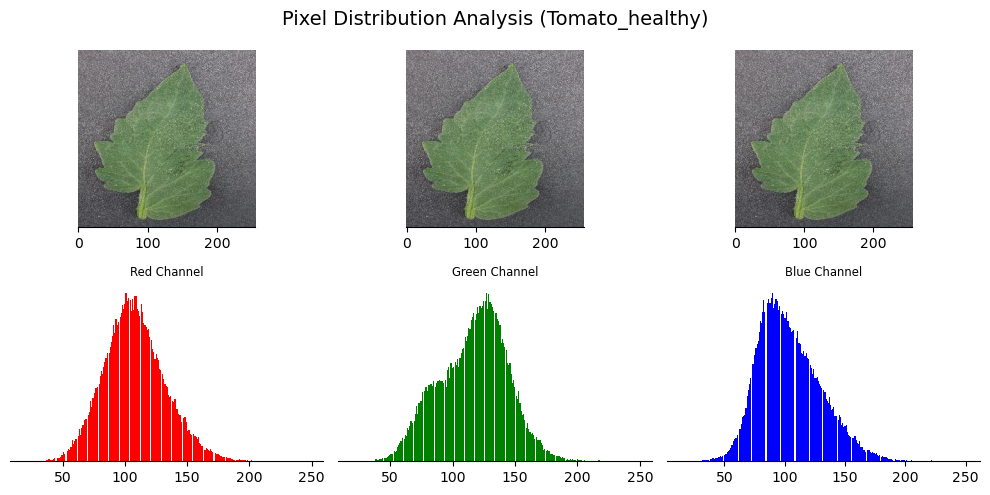

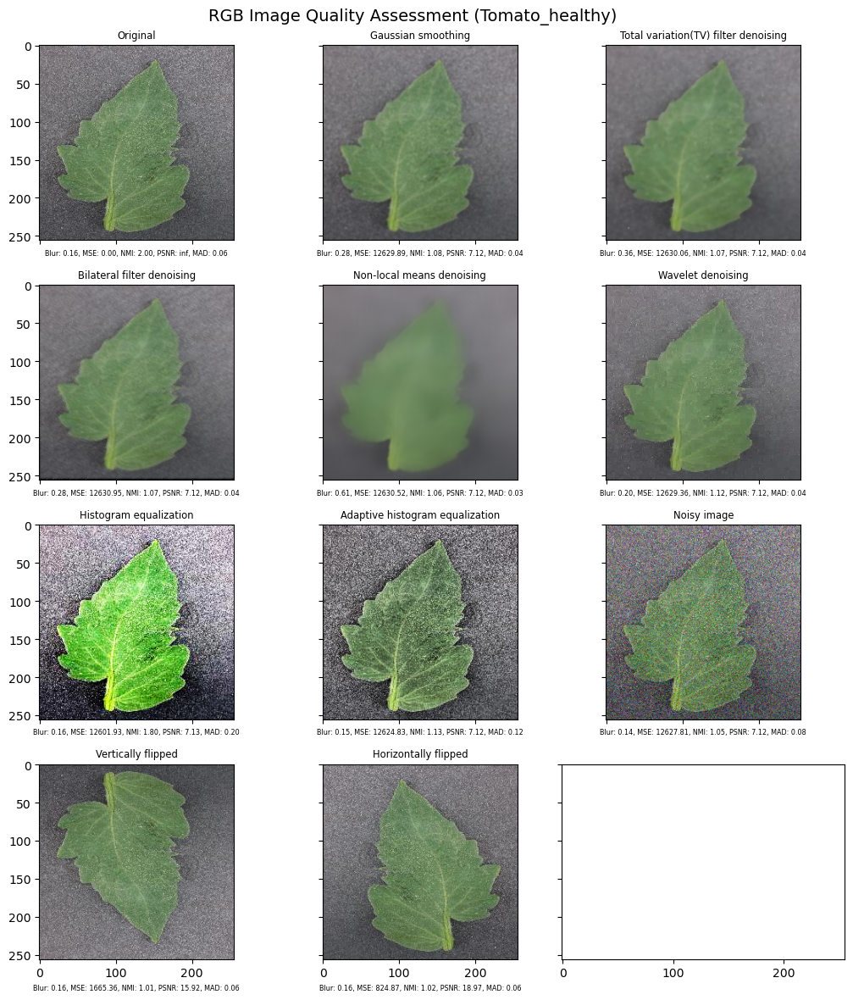

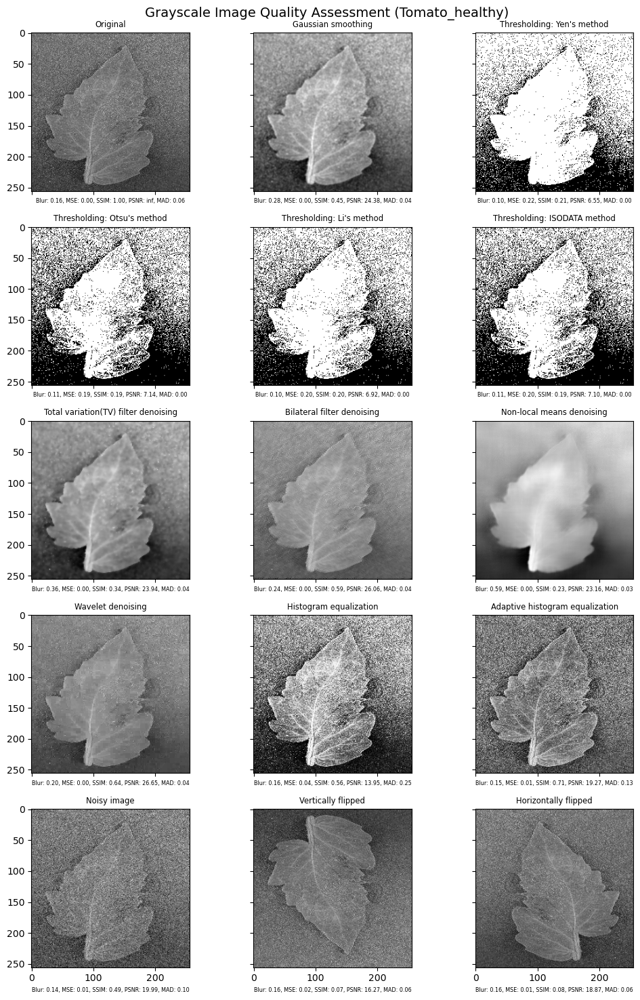



------------------------------------------------------------------------------------------------------------------------
IMAGE ANALYSIS FOR BACTERIAL_SPOT_BACTERIA in TRAIN SET
------------------------------------------------------------------------------------------------------------------------ 

Unique image sizes (width, height, channels): {(256, 256, 3)} 



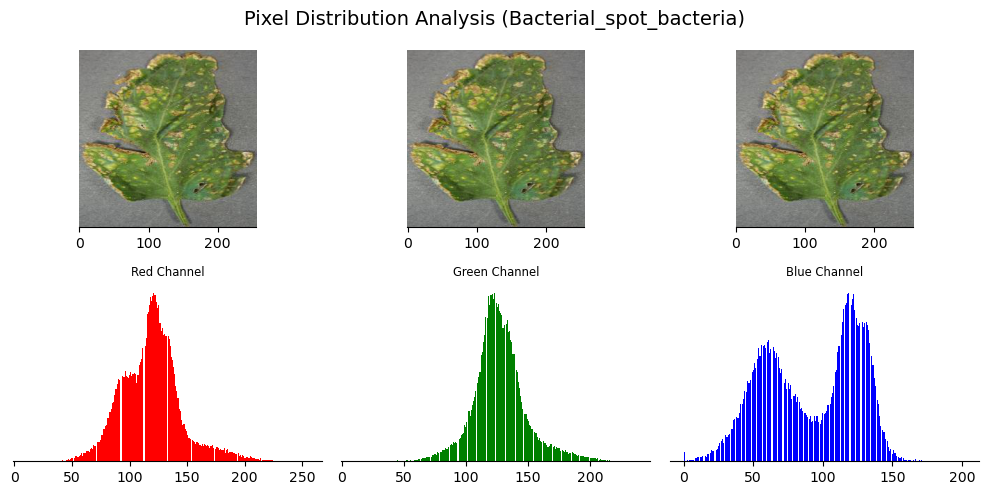

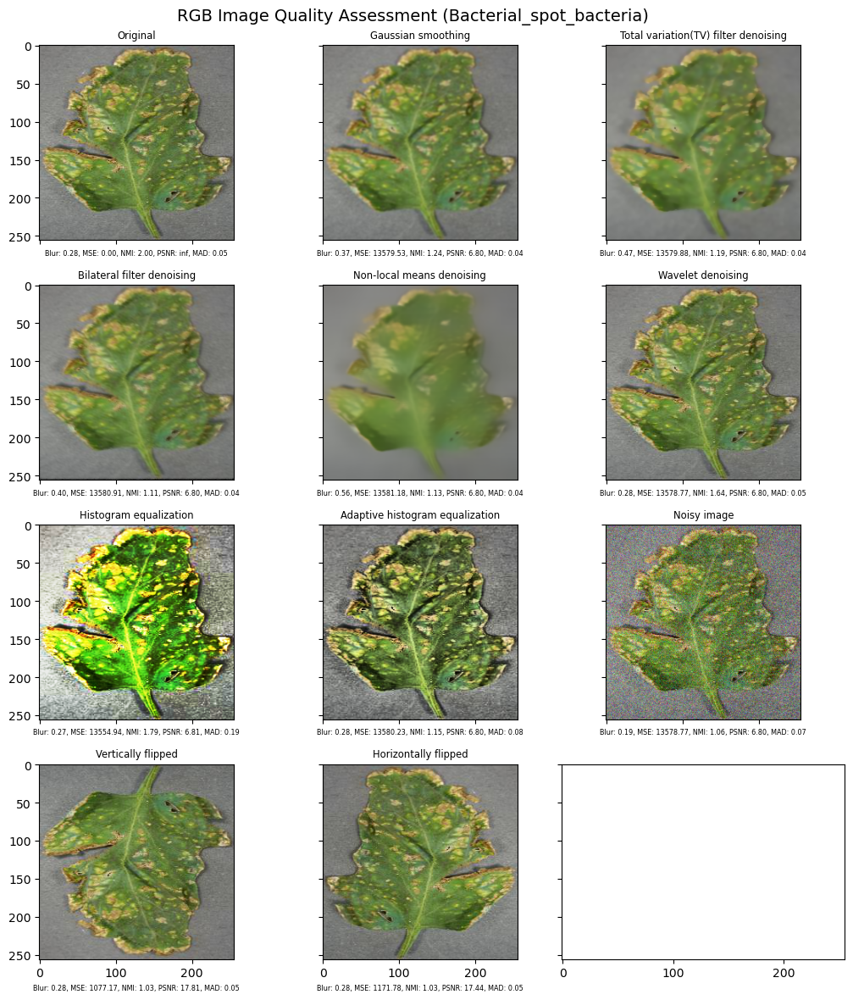

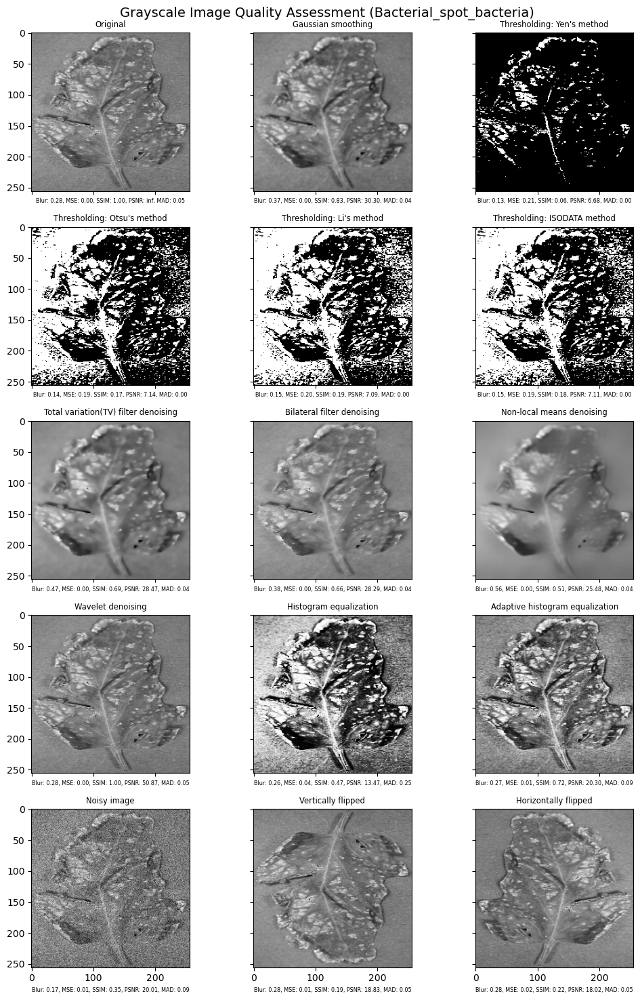



------------------------------------------------------------------------------------------------------------------------
IMAGE ANALYSIS FOR TWO-SPOTTED_SPIDER_MITE_PEST in TRAIN SET
------------------------------------------------------------------------------------------------------------------------ 

Unique image sizes (width, height, channels): {(256, 256, 3)} 



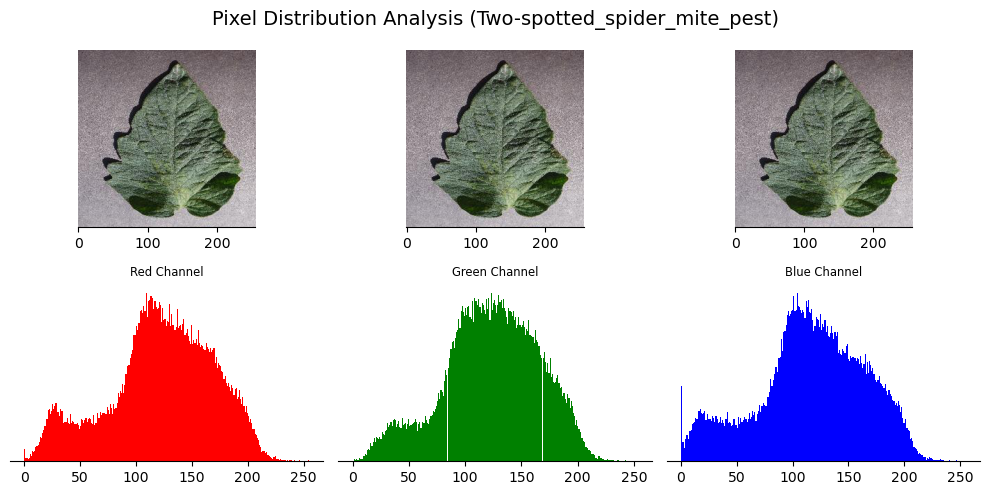

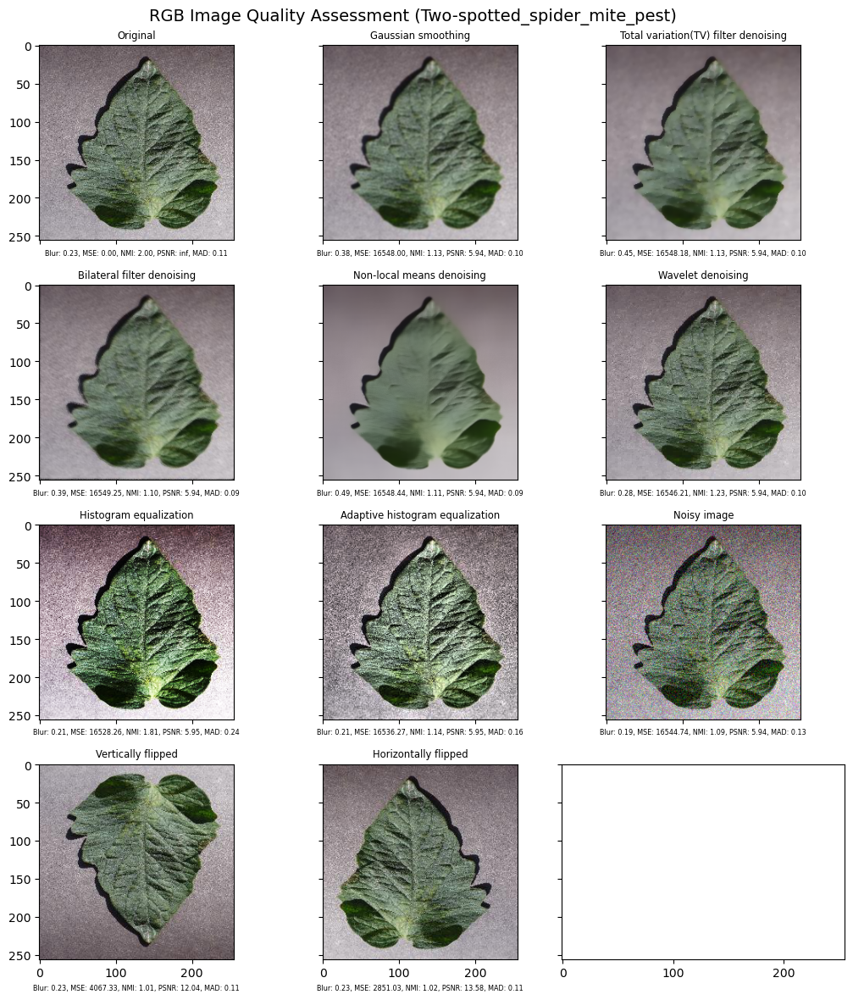

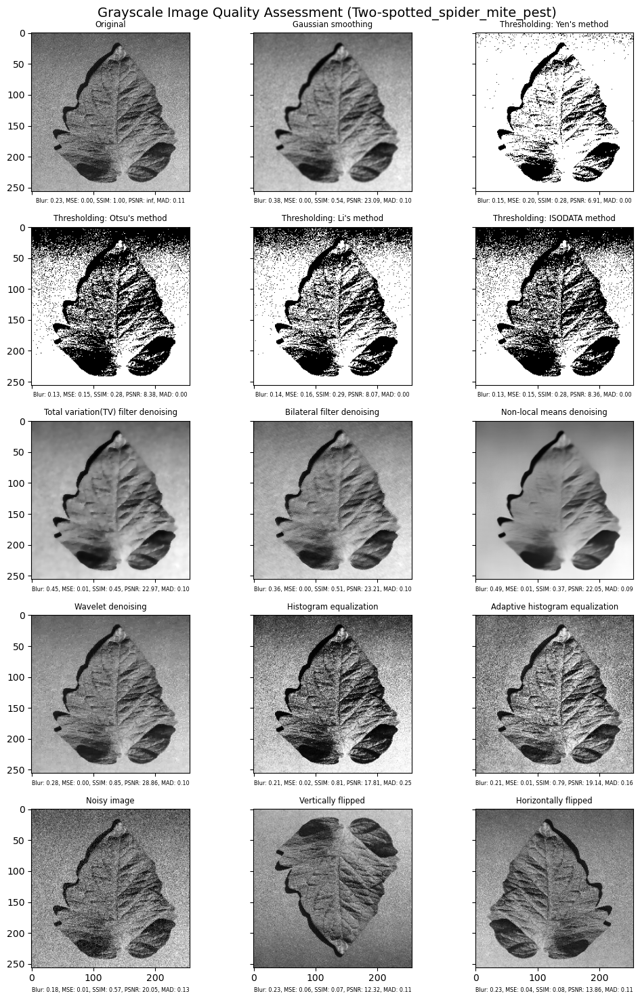



------------------------------------------------------------------------------------------------------------------------
IMAGE ANALYSIS FOR YELLOW_LEAF_CURL_VIRUS in TRAIN SET
------------------------------------------------------------------------------------------------------------------------ 

Unique image sizes (width, height, channels): {(256, 256, 3)} 



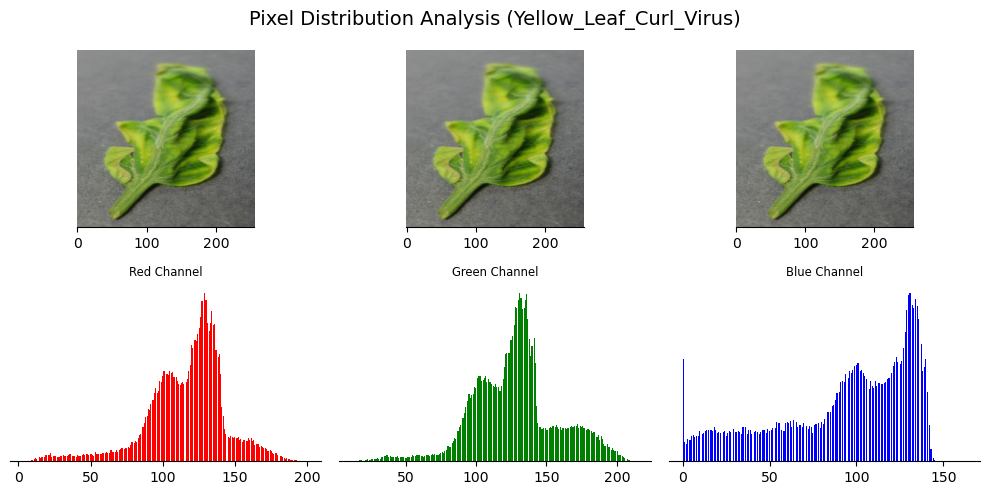

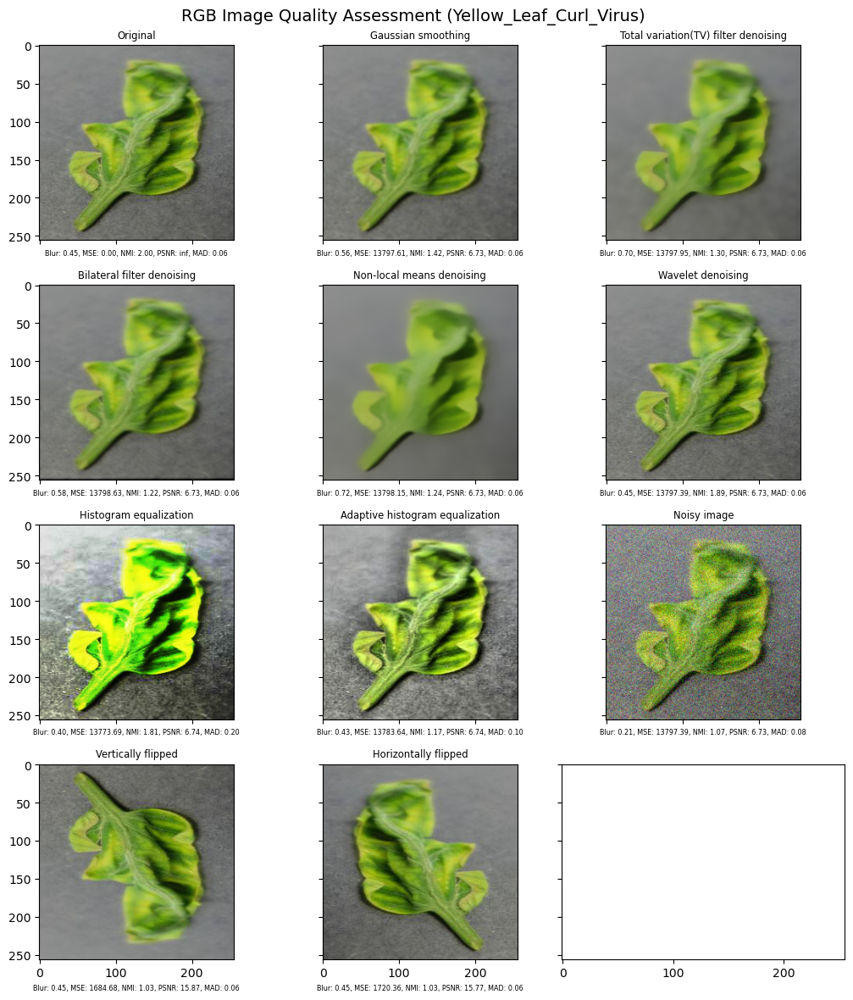

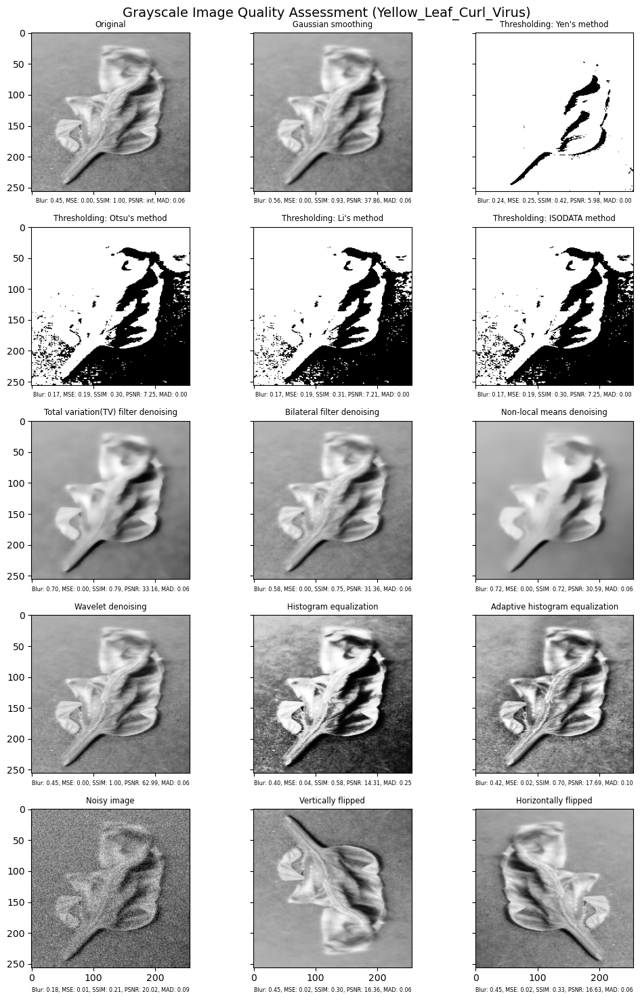

In [63]:
img_classes = ['Tomato_healthy', 'Bacterial_spot_bacteria', 'Two-spotted_spider_mite_pest', 'Yellow_Leaf_Curl_Virus']
# data_set = 'test'

run_analysis(data_paths, img_classes)

### Insights

Metrics
- NMI (Normalized Mutual Information)   - Higher is better  (range 1 to 2)
- SSIM (Structural Similarity Index)    - Higher is better  (range 0 to 1)
- MSE (Mean Squared Error)              - Lower is better
- PSNR (Peak Signal-to-Noise Ratio)     - Higher is better  
- Blur (blur effect/strength of blur)   - Lower is better   (range 0 to 1)
- MAD (Median Absolute Deviation)       - Lower is better   (intensity variability/noise levels)  

NB: NMI seems to properly qualify perceptual quality of colored images better that grayscale images. In contrast, SSIM seems to qualify grayscale images the best. 

Dataset is balanced for all classes

1. Healthy Tomato

- Almost normal distribution for all color channels
- Gaussian filter was able to smoothen or reduce noise without adding much blur and distortion.
- Ordinary histogram equalization provides better  image contrast than adaptive histogram equalization with less distortion for colored images. The reverse is the case for grayscale images
- Wavelet denoising is the most effective denoising technique for colored and grayscale images.
- Thresholding(grayscale images only) distorted the image significantly



2. Bacteria Spot

- Almost normal distribution for all color channels except the blue channel with a bimodal distribution.
- Gaussian filter was able to smoothen or reduce noise without adding much blur and distortion.
- Ordinary histogram equalization provides better  image contrast than adaptive histogram equalization with less distortion for colored images. The reverse is the case for grayscale images
- Wavelet denoising is the most effective denoising technique for colored and grayscale images.
- Thresholding(grayscale images only) distorted the image significantly

3. Two-spotted spider mite
- Almost identical and balanced distribution of pixel intensity for all color channels.
- Gaussian filter was able to smoothen or reduce noise without adding much blur and distortion.
- Standard histogram equalization provides better  image contrast than Contrast Limited Adaptive Histogram Equalization (CLAHE) with less distortion for colored images. The reverse is the case for grayscale images
- Wavelet denoising is the most effective denoising technique for colored and grayscale images.
- The Otsu global thresholding method(grayscale images only) provided the most optimal threshold.

4. Yellow Leaf Curl
- Identical distribution for all color channels except the blue channel with more lower intensity pixels below 70 and none above 150 unlike the other channels.
- Gaussian filter was able to smoothen or reduce noise without adding much blur and distortion.
- Ordinary histogram equalization provides better  image contrast than adaptive histogram equalization with less distortion for colored images. The reverse is the case for grayscale images
- Wavelet denoising is the most effective denoising technique for colored and grayscale images.
- Thresholding(grayscale images only) distorted the image significantly